# Quantitative measurements of the correlations between Artificial Life's features and behaviours using Lenia cellular automata

## Abstract
The relationship between the features and behaviors of artificial lifeforms was measured quantitatively and compared using cellular automata called Lenia. The lifeforms' size, symmetry, circularity, robustness, tolerance, and complexity were computed, and their Pearson correlation coefficients were measured and analyzed. A perfect correlation index of 0.99 was found between the lifeform's size and complexity, indicating an intrinsic linear relationship between size and complexity for a lifeform to be stable. A strong correlation of 0.7 was observed between complexity and robustness, which also suggested potential underlying linear relationships between them. The symmetry, circularity, and tolerance demonstrated very weak correlations (less than 0.5) with other variables, suggesting nonlinear or no relationships between these features. More solid conclusions could be drawn if additional data were collected and a greater variety of lifeforms were tested.

## Introduction
Artificial Life (ALife)[1] has become a popular field in recent years. It was well described by Susan Stepney and Alan Dorin as "a study of artificial systems that exhibit the behavioral characteristics of natural living systems," with an emphasis on "not only life-as-we-know-it but also life-as-it-might-be"[2]. Research in ALife could lead to advancements in computing algorithms and robotics, and has the potential to shed light on the principles underlying the emergence of life in philosophy.

The most common approach to software-based (soft) ALife involves using cellular automata (CA). It was first implemented by John Horton Conway in Conway's Game of Life[3], where discrete cells of 1 or 0 were placed in a world that followed certain rules set by the game, and patterns of lifeforms were discovered. An improvement to the Game of Life was implemented by Bert Wang-Chak Chan in the form of Lenia[4], which employed continuous cells and kernels to generate ALife. Using a semi-automated search, a great variety of ALife (317 life) was found, opening up numerous possible applications, such as ecosystem modeling.

This report aimed to develop an algorithm that quantitatively analyzed the shape features of each animal (complexity, size, symmetry, and circularity) and compared them with their corresponding behavioral features in the world (robustness and tolerance). In the method section, the algorithm was presented and explained; in the result section, the algorithm was applied to Bert's data; and in the discussion section, the limitations and possible improvements of the algorithms were analyzed, and implications to the correlations where discussed.

The results revealed a very strong correlation between the lifeform's complexity and their robustness and size, with Pearson indices of 0.7 and 0.99, respectively, which could indicate intrinsic laws governing the features of stable Lenia lifeforms. A moderate correlation was found between their final state and the robustness and tolerance, with values of 0.48 and -0.35, respectively. Circularity exhibited a weak correlation with robustness (-0.34), but symmetry demonstrated weak to no correlations with any other variables. Similarly, tolerance displayed weak to no correlation with other variables as well.

In [1]:
#Preparation
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import re
import psutil
from fractions import Fraction
import scipy
from scipy.stats import entropy
from skimage.metrics import structural_similarity
from skimage.measure import label, regionprops, find_contours
from skimage.transform import rotate
from skimage.segmentation import find_boundaries
from scipy.ndimage import binary_fill_holes
from scipy.ndimage import center_of_mass
import itertools
from tqdm import tqdm
import copy, re, itertools, json, csv
import IPython.display
import functools
import timeit
import cv2
import pandas as pd
import seaborn as sns

#I have wrote these as functions, check the .py file for more information
import LeniaFuncs as LF
import LeniaEssentials as LE

Functions from Lenia essentials are written by Bert in the tutorial "from conway to lenia"[5]

## Theoretical background and implementation

### 1. The game of life
The original Game of Life was implemented using the tutorial by Bert[5], which was adapted from the minimal code provided by Jake VanderPlas[6]. The game had three rules: 1. Any live cell with two or three live neighbors survives. 2. Any dead cell with three live neighbors becomes a live cell. 3. All other live cells die in the next generation. Similarly, all other dead cells remain dead. Consequently, a quick simulation can be written immediately.

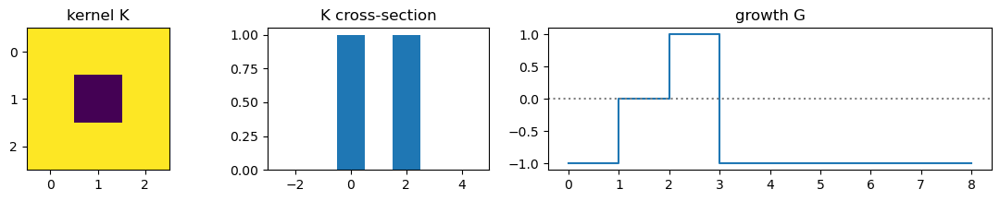

In [2]:
size = 64
R = 1
np.random.seed(0)
A = np.random.randint(2, size=(size, size))
K = np.asarray([[1,1,1], [1,0,1], [1,1,1]])
K_sum = np.sum(K)
''' define growth function with growth/shrink ranges '''
def growth(U):
  return 0 + (U==3) - ((U<2)|(U>3))
def update(i):
  global A
  U = scipy.signal.convolve2d(A, K, mode='same', boundary='wrap')
  ''' use incremental update and clipping '''
  #A = (A & (U==2)) | (U==3)
  A = np.clip(A + growth(U), 0, 1)
  img.set_array(A)
  return img,
LE.figure_asset(K, growth, K_sum=K_sum, bar_K=True)
fig, img = LE.figure_world(A, cmap='binary')
IPython.display.HTML(matplotlib.animation.FuncAnimation(fig, update, frames=50, interval=50).to_jshtml())

This code set up a 64x64 grid with randomly placed 1 and 0 within it, then it updated the grid based on the Game of Life's rules, using a convolution method for calculating the number of live neighbors. The resulting animation displayed the Game of Life in its simplist form.

### 2. primordia and Lenia
In this simulation, a kernel was utilized to sum up cells surrounding a specific cell. A growth function was employed to verify the subsequent state of the lifeform, and the update function updated its behavior in the subsequent simulation step. However, the simplicity of the game of life resulted in limited lifeform diversity, and its binary nature constrained it. Therefore, a continuous space, kernel, and growth function were required to create more intriguing lifeforms.

Initially, primordia[6] was used to make time continuous, which was a precursor to Lenia. The update function was updated as follows:

A = np.clip(A + 1/T * growth(U), 0, 1)

This not only made time continuous but also made the states continuous. The kernel was transformed into a continuous ring kernel, which altered it into a Gaussian shape. Similarly, the growth function was modified to be Gaussian for smoother growth.

C:\Users\Peter\AppData\Local\Temp\ipykernel_8896\2794532147.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  D = np.linalg.norm(np.asarray(np.ogrid[-R:R, -R:R]) + 1) / R


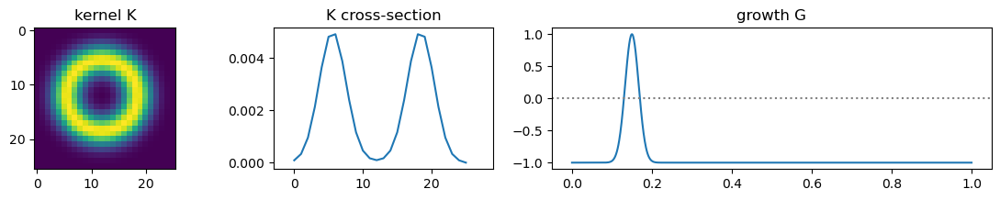

In [3]:
with open('animalsBetter.json', encoding='utf-8') as file:
	data = json.load(file)
bell = lambda x, m, s: np.exp(-((x-m)/s)**2 / 2)
size = 64
name = 'Orbium unicaudatus'
scale = 1;  cx, cy = 20, 20

params = LF.get_params(name, data)
if params:
    R = params['R']
    T = params['T']
    b = params['b']
    m = params['m']
    s = params['s']
C = np.asarray(LF.rle2arr(LF.get_cell_by_name(name, data)))

''' create empty world '''

A = np.zeros([size, size])
''' place scaled pattern '''
C = scipy.ndimage.zoom(C, scale, order=2);  R *= scale
A[cx:cx+C.shape[0], cy:cy+C.shape[1]] = C
D = np.linalg.norm(np.asarray(np.ogrid[-R:R, -R:R]) + 1) / R
K = (D<1) * bell(D, 0.5, 0.15)
K = K / np.sum(K)
def growth(U):
  return bell(U, m, s)*2-1

def update(i):
  global A, img
  U = scipy.signal.convolve2d(A, K, mode='same', boundary='wrap')
  A = np.clip(A + 1/T * growth(U), 0, 1)
  img.set_array(A)
  return img,
LE.figure_asset(K, growth, R = R)
fig, img = LE.figure_world(A)
animation = matplotlib.animation.FuncAnimation(fig, update, frames=300, interval=20).to_jshtml()
IPython.display.HTML(animation)

### Optimising Lenia
In Lenia, the kernel, growth function, and space were made continuous. To place the lifeform named Orbium unicaudatus inside the frame, this code searched the animalsBetter.json file to retrieve its parameters and cells. However, using the convolution method, scipy.signal.convolve2d has a time complexity of $O(n^2 * m^2)$, which can be very time-consuming when the canvas is large (256 x 256). Hence, an alternative method using Fourier transform was implemented, which utilizes fft with a complexity of $O(n^2 * log(n^2))$.

C:\Users\Peter\anaconda3\lib\site-packages\numpy\linalg\linalg.py:2508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = asarray(x)


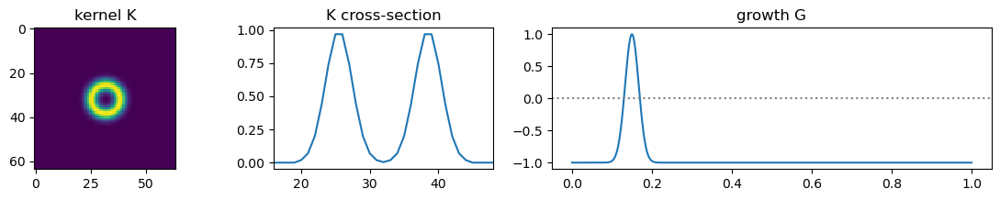

In [4]:
from PIL import Image
with open('animalsBetter.json', encoding='utf-8') as file:
	data = json.load(file)
name = 'Orbium unicaudatus'
params = LF.get_params(name, data)
if params:
    R = params['R']
    T = params['T']
    b = params['b']
    m = params['m']
    s = params['s']
bell = lambda x, m, s: np.exp(-((x-m)/s)**2 / 2)
size = 64;  mid = size // 2;  scale = 1
# cx, cy = 20, 20
A = np.zeros([size, size])
C = np.asarray(LF.rle2arr(LF.get_cell_by_name(name, data)))
cx = A.shape[0] // 2 - C.shape[0] // 2
cy = A.shape[1] // 2 - C.shape[1] // 2
A[cx:cx+C.shape[0], cy:cy+C.shape[1]] = C

D = np.linalg.norm(np.ogrid[-mid:mid, -mid:mid]) / R
K = (D<1) * bell(D, 0.5, 0.15)

fK = np.fft.fft2(np.fft.fftshift(K / np.sum(K)))
def growth(U):
    return bell(U, m, s)*2-1
def update(i):
    global A, img
    U = np.real(np.fft.ifft2(fK * np.fft.fft2(A)))
    A = np.clip(A + 1/T * growth(U), 0, 1)
    img.set_array(A)
    return img,
LE.figure_asset(K, growth, R=R)
fig, img = LE.figure_world(A)
animation = matplotlib.animation.FuncAnimation(fig, update, frames=200, interval=20).to_jshtml()
IPython.display.HTML(animation)

A quick test was conducted using these two methods to determine the time required to run each method for 100 steps. The FFT-based method took only seven percent of the time required by the convolution method. This made it highly scalable when running large samples. Although memory data was not accurately captured due to internal optimizations within the Python software, memory would not be an issue when the animation is scaled up. Lenia was further optimized by avoiding the use of the matplotlib.animation.FuncAnimation package. Instead of wasting a considerable amount of time animating the lifeform for display on the screen, a for loop was used in the "LF.animate_lenia" function to optimise the speed of the animation.

In [5]:
@LF.memory_usage
def update_fft(A, fK):
    U = np.real(np.fft.ifft2(fK * np.fft.fft2(A)))
    A = np.clip(A + 1/T * growth(U), 0, 1)
    return A

@LF.memory_usage
def update_conv(A, K):
    U = scipy.signal.convolve2d(A, K, mode='same', boundary='wrap')
    A = np.clip(A + 1/T * growth(U), 0, 1)
    return A

fK = np.fft.fft2(K) 

# Wrap the update functions for timeit
def update_fft_wrapper():
    update_fft(A, fK)

def update_conv_wrapper():
    update_conv(A, K)

fft_time = timeit.timeit(update_fft_wrapper, number=100)
conv_time = timeit.timeit(update_conv_wrapper, number=100)

print(f"FFT-based update function took {fft_time:.5f} seconds.")
print(f"Convolution-based update function took {conv_time:.5f} seconds.")

update_fft.display_memory_usage()
update_conv.display_memory_usage()

FFT-based update function took 0.02887 seconds.
Convolution-based update function took 3.25975 seconds.
Total memory usage: 0.00 B
Total memory usage: 56.00 KB


### Multi Ring Kernel Lenia

To enable certain animals to live, multiple Ring Kernels were required. This allowed the addition of an extra parameter "b," which defines the position of the other ring kernels. Implementing this required modifying the kernel K to include the parameter "b." The following parts needed adjustment if the lifeform contained more than one ring kernel:

In [6]:
b = str('1, 1/2')
b = np.asarray(LF.turn_to_float(b))
D = np.linalg.norm(np.ogrid[-mid:mid, -mid:mid]) / R * len(b)
K = (D<len(b)) * b[np.minimum(D.astype(int),len(b)-1)] * bell(D % 1, 0.5, 0.15)

C:\Users\Peter\anaconda3\lib\site-packages\numpy\linalg\linalg.py:2508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = asarray(x)


## Methods and results
### 1.classifying lifeform's state
In Lenia, lifeforms exhibit different forms of growth and can be categorized into three groups: extinct, stable, and soup. Extinct animals disappear from the world after a specific frame, while stable animals maintain their shape and features indefinitely and can continuously live in the world. Soup animals transform into a mesh that fills the entire space and become stable thereafter, losing all structural information and resembling soup. The code below demonstrates what an extinct and soup lifeform looks like. (Note: the displayed video may be hidden behind your browser.)

In [7]:
#Runnning this code a window will pop up that will close when the animation is finished,
#sometimes the window can be hidden behind your browser please check
#Attempting to close the window will just cause another window to open
#if you want to terminate the program you need to stop running this code by interupting the kernel
#The window will close once the animation finishes so don't worry

cap = cv2.VideoCapture("extinctDemo.mp4")
ret, frame = cap.read()
while(1):
   ret, frame = cap.read()
   if ret:
       cv2.imshow('frame',frame)
   if cv2.waitKey(1) & 0xFF == ord('q') or not ret:
       cap.release()
       cv2.destroyAllWindows()
       break

In [8]:
cap = cv2.VideoCapture("soupDemo.mp4")
ret, frame = cap.read()
while(1):
   ret, frame = cap.read()
   if ret:
       cv2.imshow('frame',frame)
   if cv2.waitKey(1) & 0xFF == ord('q') or not ret:
       cap.release()
       cv2.destroyAllWindows()
       break

In order to classify these animals, image checks were performed on the important frames. The first check was the extinction check, which involved summing up all the cell values in the space. If the sum was zero, the animal was classified as extinct. If the lifeform was not extinct at the end of the simulation, another check was performed using the LF.soup_or_stable function. This function divided the entire space into two by two grids and computed the sum of each grid. If the number of grids with summed values greater than zero exceeded a specific threshold, the lifeform was considered a soup, and vice versa. These analyses successfully separated the animals into three categories.

The code below used an optimized Lenia to compute the evolution of ten lifeforms. The code adjusted for cx and cy (the position of the animal to place in the world) to be at the center to accommodate animals of different sizes. The canvas was set to 256 to ensure all the lifeforms could fit within the canvas. Downscaling the lifeforms could result in information loss and deviated from the actual measurement.

In [10]:
with open('animalsConcise.json', encoding='utf-8') as file:
	data = json.load(file)
results = []
for animal in data:
    name = animal['name']
    params = animal['params']
    if params:
        R = params['R']
        T = params['T']
        b = params['b']
        m = params['m']
        s = params['s']
    rle_cells = animal['cells']
    b = np.asarray(LF.turn_to_float(b))
    cells = LF.rle2arr(rle_cells)
    size = 256
    mid = size//2
    
    A = np.zeros([size, size])
    cx = A.shape[0] // 2 - cells.shape[0] // 2
    cy = A.shape[1] // 2 - cells.shape[1] // 2
    A[cx:cx+cells.shape[0], cy:cy+cells.shape[1]] = cells
    initial_frame = A.copy()
    initial_entropy = LF.information_entropy(LF.probability_distribution(LF.create_histogram(LF.normalize(initial_frame))))
    

    D = np.linalg.norm(np.ogrid[-mid:mid, -mid:mid]) / R * len(b)
    K = (D<len(b)) * b[np.minimum(D.astype(int),len(b)-1)] * bell(D % 1, 0.5, 0.15)
    fK = np.fft.fft2(np.fft.fftshift(K / np.sum(K)))
    def growth(U):
        return bell(U, float(m), float(s)) * 2 - 1
    no_cells_frame = None
    for i in range(300):
        U = np.real(np.fft.ifft2(fK * np.fft.fft2(A)))
        A = np.clip(A + 1/float(T) * growth(U), 0, 1)
        if np.sum(A) == 0 and no_cells_frame is None:
            no_cells_frame = i
            break
    final_frame = A.copy()
    ssim_index = None
    final_entropy = None
    if no_cells_frame is None:
        final_state_check = LF.soup_or_stable(final_frame)
        final_entropy = LF.information_entropy(LF.probability_distribution(LF.create_histogram(LF.normalize(final_frame))))
    else:
        final_state_check = None
        final_entropy = None

    results.append((name, no_cells_frame if no_cells_frame is not None else -1, final_state_check, initial_entropy, final_entropy))
df = pd.DataFrame(results, columns=['Animal', 'Extinction Frame', 'final_state', 'initial_entropy', 'final_entropy'])
print(df)

                     Animal  Extinction Frame final_state  initial_entropy  \
0        Orbium unicaudatus                -1      stable         0.042882   
1  Orbium unicaudatus ignis                56        None         0.038502   
2         Orbium bicaudatus                -1      stable         0.038525   
3   Orbium bicaudatus ignis                67        None         0.031721   
4          Gyrorbium gyrans                -1      stable         0.047704   
5          Gyrorbium labans                -1        soup         0.043673   
6           Vagorbium vagus                -1        soup         0.117813   
7                 Synorbium                -1      stable         0.072552   
8           Tetrasynorbium?                -1      stable         0.432581   

   final_entropy  
0       0.041537  
1            NaN  
2       0.039994  
3            NaN  
4       0.052519  
5       1.462834  
6       1.255590  
7       0.073078  
8       0.440757  


### 2. Information Entropy
On top of quantifying the animals' final state and extinction frame, the complexity and diversity of the animal could be quantified using information entropy. Shannon's entropy formula, $H(\chi) = -\sum p(x) \ln p(x)$, was employed to quantify the animals' complexity. The animals' cells were first separated into discrete distributions as a histogram, and the entropy was then computed using the scipy.stats.entropy package. To avoid the computational cost of considering spatial correlations between cells, this method neglected such correlations. However, this method proved to be an effective means of calculating soup_or_stable since all soup states have similar entropy values above 1.0 (which is very high), providing a less costly method of computing it. Therefore, the first frame entropy was used to measure the intrinsic complexity of the animal, while the last frame could have been used to measure the final state of the animal.

The calculated data for all 316 life forms were printed. The analysis had focused only on cell value distributions, without considering spatial relationships.

In [11]:
output_file = 'AnimalOutput.csv'
df = pd.read_csv(output_file)
print(df)

                       Animal  Extinction Frame Final state check  \
0          Orbium unicaudatus                -1            stable   
1    Orbium unicaudatus ignis                56               NaN   
2           Orbium bicaudatus                -1            stable   
3     Orbium bicaudatus ignis                67               NaN   
4            Gyrorbium gyrans                -1            stable   
..                        ...               ...               ...   
312         Nonafolium rotans                -1            stable   
313       Dodecafolium lithos                69               NaN   
314      Tridecafolium lithos                -1            stable   
315             Bug (smaller)                54               NaN   
316              Bug (bigger)                -1              soup   

     Initial Entropy  Final Entropy  \
0           0.042882       0.042029   
1           0.038502            NaN   
2           0.038525       0.040014   
3           0.0

### 3.Lagrangian Frame Lenia
A good measure of the structural differences between the initial and the final staes was the MSE (Mean Squared Error) and SSIM (Structural Similarity Index). The MSE index calculated the average square differences between the two images with the equation $\frac{1}{N}\sum_{i=1}^N (x_i - y_i)^2$ while the SSIM took into account of luminicent, contrast and structure. In this case the luminicent and contrast of the lifeforms did not vary hugely, the structural similarity part had the equation $\frac{\sigma_{xy} + c}{\sigma_x \sigma_y +c}$ where $\sigma$ were the variance and covariances and c was a variable that stabilize the division.

This meant that the SSIM measured the general percieved differences in the two images, and any two images that had a general structure similarity would result in a higher SSIM index, on the other hand, the MSE took into account of the difference in each individual cells, this meant that MSE is more penalising on the differences between two images.

However, lenia in cartesian coordinates would not work with these indicies, since a translation or a rotation of the animal could result in a large MSE index, which is principly wrong. So a lagragian frame Lenia was introduced.

In [12]:
with open('animalsBetter.json', encoding='utf-8') as file:
	data = json.load(file)

def update_lagrangian(i):
    global A, img
    center = center_of_mass(A)
    center_rounded = np.round(center).astype(int)
    shift = np.array(A.shape) // 2 - center_rounded
    A = LF.shift_array(A, shift)

    U = np.real(np.fft.ifft2(fK * np.fft.fft2(A)))
    A = np.clip(A + 1 / T * growth(U), 0, 1)
    img.set_array(A)

    A = LF.shift_array(A, -shift)
    return img,
def growth(U):
  return bell(U, m, s)*2-1

name = 'Crucium arcus gyrans'
params = LF.get_params(name, data)
if params:
    R = params['R']
    T = params['T']
    b = params['b']
    m = params['m']
    s = params['s']
b = np.asarray(LF.turn_to_float(b))
bell = lambda x, m, s: np.exp(-((x-m)/s)**2 / 2)
size = 256;  mid = size // 2;  scale = 1
A = np.zeros([size, size])
C = np.asarray(LF.rle2arr(LF.get_cell_by_name(name, data)))
cx = A.shape[0] // 2 - C.shape[0] // 2
cy = A.shape[1] // 2 - C.shape[1] // 2
C = scipy.ndimage.zoom(C, scale, order=0);  R *= scale
A[cx:cx+C.shape[0], cy:cy+C.shape[1]] = C
D = np.linalg.norm(np.ogrid[-mid:mid, -mid:mid]) / R * len(b)
K = (D<len(b)) * b[np.minimum(D.astype(int),len(b)-1)] * bell(D % 1, 0.5, 0.15)
fK = np.fft.fft2(np.fft.fftshift(K / np.sum(K)))
fig, img= LE.figure_world(A)
animation = matplotlib.animation.FuncAnimation(fig, update_lagrangian, frames=300, interval=20).to_jshtml()
# LE.figure_asset(K, growth, R)
IPython.display.HTML(animation)

C:\Users\Peter\anaconda3\lib\site-packages\numpy\linalg\linalg.py:2508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = asarray(x)


This was achieved by first finding the centre of mass of the lifeform, then shifting the array (which act as a shift of the coordinate system) to the centre of mass, so the lifeform was constantly kept in the centre of the array. This meant that for lifeforms such as Orbium Unicaudatus where the lifeform moved in a straight line without any change of shape, the lagragian frame would be output the lifeform being stable. This has allowed the calculation of MSE and SSIM of the lifeform, since when campared the two frames, spatial translation wouldn't have affected the valule. 

### 4 Robustness
The SSIM inedex and MSE index on the evolving lifeform had little purpose since the lifeforms that were able to live indefinitely follow either static or oscillatory motion. Meaning the SSIM and MSE will be very high and very low respectively. Capturing very little extra information about each individual lifeform's behaviour.

Hence the robustness of the lifeform was measured to determine how sturdy the animal behaves when subjected to perturbation. The robustness was defined as the ability for the lifeform to return to its original structure upon a perturbation to the system was applied. The code that encaptures the robustness of the animal was written in LeniaFuncs.py under the function LF.calculate_robustness. 

The robustness of the animal was calculated as follows. The calculate_robustness was used to compute the MSE and SSIM index for each perturbation value by calling 'measure_recovery', then it was used to calculate the area under the curve (AUC) for both mse and ssim to quantify the robustness. The perturbation was applied via two different functions called perturb_pattern and pertub_patternalt, which randomly fliped cells in the entire world A or fliped cells only in the animals. The measure_recovery function first used perturb_patternalt function to randomly flip cells within the animal, then it runs the simulation for a number of recovery steps using the run_simulation function, which was essentially optimised Lenia in the previous section in Lagrangian frames. Then it used the similarity function, which compared the initual A and the recovered A using MSE and ssim index.

In [2]:
with open('animalsConcise.json', encoding='utf-8') as file:
    data = json.load(file)
bell = lambda x, m, s: np.exp(-((x-m)/s)**2 / 2)  
def growth(U, m, s):
    return bell(U, m, s) * 2 - 1
Robust = list()
for animal in tqdm(data, desc='Processing animals', unit='animal'):
    name = animal['name']
    #Change this to run faster
    size = 32
    mid = size // 2
    rle_cells = LF.get_cell_by_name(name, data)
    C = LF.rle2arr(rle_cells)
    params = LF.get_params(name, data)
    if params:
        R = params['R']
        T = params['T']
        b = params['b']
        m = params['m']
        s = params['s']
    b = np.asarray(LF.turn_to_float(b))
    A = np.zeros([size, size])
    #Use these two lines if you want to reduce the size of the world and increase speed.
    #The pre generated response will be in size = 256.
    C, scale_factor = check_and_resize(C, size)
    R *= scale_factor
    
    
    cx = (size - C.shape[0]) // 2
    cy = (size - C.shape[1]) // 2
    A[cx:cx+C.shape[0], cy:cy+C.shape[1]] = C

    D = np.linalg.norm(np.ogrid[-mid:mid, -mid:mid]) / R * len(b)
    K = (D<len(b)) * b[np.minimum(D.astype(int),len(b)-1)] * bell(D % 1, 0.5, 0.15)
    fK = np.fft.fft2(np.fft.fftshift(K / np.sum(K)))
    # print(A)
    p_values = np.linspace(0, 1, 21)
    recovery_steps = 200

    # Calculate the robustness
    mse_auc, ssim_auc= LF.calculate_robustness(A, fK, T, m, s, recovery_steps, p_values, C, growth)
    Robust.append((name, mse_auc, ssim_auc))

# Display the results in a DataFrame
df = pd.DataFrame(Robust, columns=['Animal', 'MSE', 'SSIM'])

Processing animals:   0%|                                                                    | 0/9 [00:00<?, ?animal/s]C:\Users\Peter\anaconda3\lib\site-packages\numpy\linalg\linalg.py:2508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = asarray(x)
Processing animals: 100%|████████████████████████████████████████████████████████████| 9/9 [02:32<00:00, 16.93s/animal]


In [3]:
print(df)

                     Animal       MSE      SSIM
0        Orbium unicaudatus  0.000752  0.990557
1  Orbium unicaudatus ignis  0.000493  0.991277
2         Orbium bicaudatus  0.000598  0.991877
3   Orbium bicaudatus ignis  0.000346  0.992415
4          Gyrorbium gyrans  0.102580  0.410439
5          Gyrorbium labans  0.075060  0.480376
6           Vagorbium vagus  0.245096  0.239883
7                 Synorbium  0.006575  0.951921
8           Tetrasynorbium?  0.113461  0.541381


### 5 Tolerance
In Lenia, every animal had a given set of parameters m and s, which were its growth functions that set the fundamental rules of the lifeform. m set the position of the peak of the Gaussian curve, which indicated the ideal number of adjacent cells to allow growth, s set the variance of the Gaussian curve, which indicated the width of the Gaussian curve. Each lifeform could only live stably within a set parameters, if the parameters were changed by a lot, the lifefform would became unstable. Hence the ability for the animal to live stably when its ideal environment were perturbed could be quantified as the tolerance.

Tolerance was calculated by first adding a perturbation to the system. the perturbation will create a 10 values of m and s each from 0.8 to 1.2 times the original value. The function called perturbation perturbed the pattern and created an array fo m and s. This array was then used in the function called tolerance, that created a combination of values of m and s to create an array of 100 combination of m and s. The simulation was then ran with this combinations, and the number parameters m and s that resulted in a stable life form was returned. These parameters were called the good_parameters. The tolerance was then defined as the number of good_parameters was divided by the total number of parameters tried. Hence 0 represented no tolerance and 1 represented tolerance within twenty percent changes in its surroundings. 

In [3]:
with open('animalsConcise.json', encoding='utf-8') as file:
    data = json.load(file)
tol, results, good_params = LF.tolerance('Orbium unicaudatus', data)
print(tol)
print(good_params)

Orbium unicaudatus


100%|██████████████████████████████████████████████████| 100/100 [01:15<00:00,  1.33it/s]


0.39
[(0.12666666666666665, 0.013600000000000001, 13, 10), (0.12666666666666665, 0.014355555555555557, 13, 10), (0.13333333333333333, 0.013600000000000001, 13, 10), (0.13333333333333333, 0.014355555555555557, 13, 10), (0.13333333333333333, 0.015111111111111112, 13, 10), (0.13333333333333333, 0.015866666666666668, 13, 10), (0.13999999999999999, 0.013600000000000001, 13, 10), (0.13999999999999999, 0.014355555555555557, 13, 10), (0.13999999999999999, 0.015111111111111112, 13, 10), (0.13999999999999999, 0.015866666666666668, 13, 10), (0.13999999999999999, 0.016622222222222222, 13, 10), (0.13999999999999999, 0.017377777777777777, 13, 10), (0.13999999999999999, 0.018133333333333335, 13, 10), (0.14666666666666667, 0.013600000000000001, 13, 10), (0.14666666666666667, 0.014355555555555557, 13, 10), (0.14666666666666667, 0.015111111111111112, 13, 10), (0.14666666666666667, 0.015866666666666668, 13, 10), (0.14666666666666667, 0.016622222222222222, 13, 10), (0.14666666666666667, 0.0173777777777777

To visualise the results a heat map could be plotted, and the tolerance was effctively the area of the filled area to the total area.

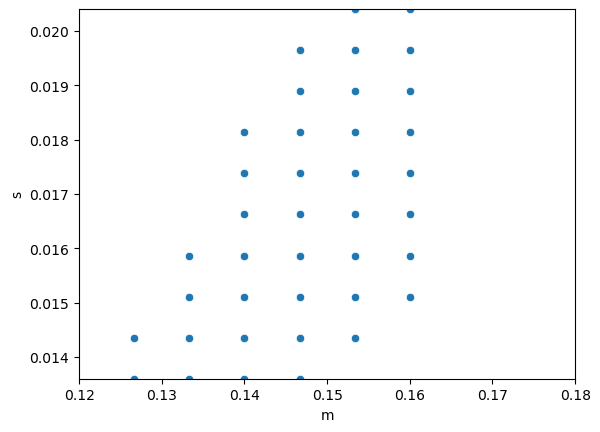

In [6]:
name = 'Orbium unicaudatus'
params = LF.get_params(name, data)
if params:
    R = params['R']
    T = params['T']
    b = params['b']
    m = params['m']
    s = params['s']

x_range = [m * 0.8, m * 1.2]
y_range = [s * 0.8, s * 1.2]

# Retrieve the first and second values from each tuple in alive_params
x = [param[0] for param in good_params]
y = [param[1] for param in good_params]

sns.scatterplot(x=x, y=y)
plt.xlim(x_range)
plt.ylim(y_range)
plt.xlabel('m')
plt.ylabel('s')
plt.show()

The tolerance could be extended to the entire dataset, this was very computationally costly, and roughly took three hours to run through the entire data set. The completed data was found and merged into a single csv file

In [7]:
df = pd.read_csv('ConciseAnimalBehaviour.csv')
print(df)

                       Animal       MSE      SSIM  tolerance
0          Orbium unicaudatus  0.000718  0.991095       0.39
1    Orbium unicaudatus ignis  0.002778  0.971288       0.22
2           Orbium bicaudatus  0.000569  0.992266       0.51
3     Orbium bicaudatus ignis  0.000346  0.992415       0.03
4            Gyrorbium gyrans  0.107391  0.377634       0.11
..                        ...       ...       ...        ...
380         Nonafolium lithos  0.010332  0.960509       0.28
381         Nonafolium rotans  0.012083  0.962763       0.30
382      Tridecafolium lithos  0.073310  0.630249       0.19
383             Bug (smaller)  0.012970  0.955893       0.03
384              Bug (bigger)  0.033327  0.913660       0.02

[385 rows x 4 columns]


### 6 Features of lifeforms
The features of the lifeform could be tested by quantitatively define the size, symmetry and circularity of the lifeform. The size of the lifeform was measured by summing up the entire array, where the bigger the lifeform the greater its size would be. 

The symmetry of the lifeform was measured by flipping the image across the axis and compare their dice_coefficients. The reason dice_coefficients were used instead of MSE or SSIM was that MSE penalises on the smalled details, which differed greatly from human perceptions. SSIM on the other hand took into account mainly on the structural information of the lifeforms, which worked poorly when the lifeform was circular or long. Dice_coefficient effectively analysed the overlap between the flipped image and the original image, this was the intermediate between the two indicies which worked particucarly well distinct symmetries between lifeforms compared to human comparison. the lifeforms didn't always had their symmetric axis aligned to x or y, so the image was rotated one degree at a time and the dice_coefficient was compared. The largest dice_coefficient was used as the measure of symmetry.

The circularity was defined as $ C = 4 \pi A / P^2 $ where A was the area, and P was the perimeter of the object. A full circle would output the maximum circularity of 1. The function calculate_circularity was used to find this result. Firstly the lifeform's perimeters were found by using skimage.measure.find_contours, and the perimeter was found by summing up the distances between each individual contour points in the lifeform. To calculate the area, the scipy.ndimage.binary_fill_holes were used to first fill 'holes' within the lifeform, these holes sometimes aren't eactly zero in the lifeform, but they shouldn't be counted when considered area' then the filled area was subtracted from the entire area, which then the circularity was correctly calculated.

In [13]:
with open('animalsBetter.json', encoding='utf-8') as file:
	data = json.load(file)

feature_data = []

for animal in tqdm(data, desc='Processing animals', unit='animal(s)'):
    name = animal["name"]
    rle_cells = LF.get_cell_by_name(name, data)
    shape = np.asarray(LF.rle2arr(rle_cells))
    size = LF.calculate_size(shape)
    symmetry = LF.calculate_symmetry(shape)
    circularity = LF.calculate_circularity(shape)
    
    feature_data.append([name, size, symmetry, circularity])
    
    
df = pd.DataFrame(feature_data, columns=["Animal", "size", "symmetry", "circularity"])
print(df)

Processing animals: 100%|█████████████████████████████████████████████████████| 317/317 [00:23<00:00, 13.67animal(s)/s]

                       Animal  size  symmetry  circularity
0          Orbium unicaudatus   222  0.906574     0.329118
1    Orbium unicaudatus ignis   198  0.938931     0.447182
2           Orbium bicaudatus   201  0.891386     0.205416
3     Orbium bicaudatus ignis   179  0.922449     0.500758
4            Gyrorbium gyrans   253  0.819620     0.291563
..                        ...   ...       ...          ...
312         Nonafolium rotans  1043  0.894188     0.423553
313       Dodecafolium lithos   986  0.965000     0.124917
314      Tridecafolium lithos  1425  0.923529     0.339647
315             Bug (smaller)   213  0.937984     0.253546
316              Bug (bigger)   861  0.944849     0.215721

[317 rows x 4 columns]


In [33]:
df1 = pd.read_csv('AnimalOutput.csv')
df2 = pd.read_csv('animal_features.csv')
df3 = pd.read_csv('ConciseAnimalBehaviour.csv')
merged_df1 = pd.merge(df1, df2, on='Animal')
merged_df = pd.merge(merged_df1, df3, on='Animal')
merged_df_clean = merged_df.drop_duplicates(subset='Animal', keep='first')
print(merged_df_clean)
merged_df_clean.to_csv('EverythingData.csv', index=False)

                        Animal  Extinction Frame Final state check  \
0           Orbium unicaudatus                -1            stable   
1     Orbium unicaudatus ignis                56               NaN   
2            Orbium bicaudatus                -1            stable   
3      Orbium bicaudatus ignis                67               NaN   
4             Gyrorbium gyrans                -1            stable   
...                        ...               ...               ...   
1040         Nonafolium lithos                -1            stable   
1041         Nonafolium rotans                -1            stable   
1042      Tridecafolium lithos                -1            stable   
1043             Bug (smaller)                54               NaN   
1044              Bug (bigger)                -1              soup   

      Initial Entropy  Final Entropy  \
0            0.042882       0.042029   
1            0.038502            NaN   
2            0.038525       0.040014   

Putting everything together into one csv file, their correlations could be calculated.

### Correlation matrix
These values except for the column'params' could be used to find the correlation matrix between. This allowed us to use pearson correlation to compare if there were any linear relationships between these values

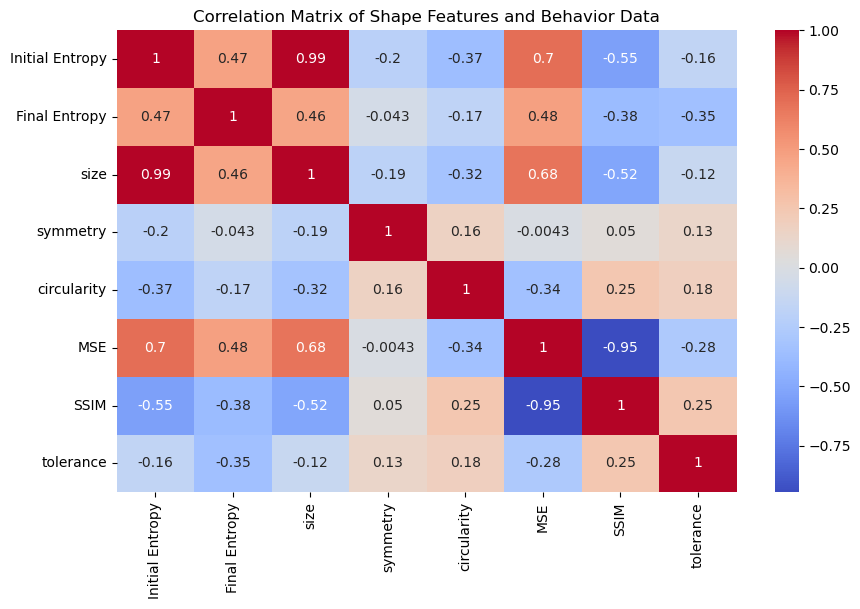

In [36]:
# merged_df_dropped = merged_df_clean.drop('params', axis=1)
correlation_matrix = merged_df_clean[['Initial Entropy', 'Final Entropy', 'size', 'symmetry', 'circularity', 'MSE', 'SSIM', 'tolerance']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Shape Features and Behavior Data')
plt.show()

## Discussion
### 1.lifeform's complexity (Initial Entropy) and size
The initial entropy had measured the information entropy of the lifeform, without considering their spatial features. The lifeform's cells had been separated into histograms, with corresponding probability distributions of their respective values. From the correlation matrix, a nearly perfect correlation of 0.99 had been observed with size, indicating a linear relationship between information entropy and size, with entropy increasing as size increased. However The size had been calculated by summing the number of cells containing non-zero elements, which would have not affected the calculation of the information entropy. This had suggested that this behavior was not an intrinsic property of the code, but a possible linear relationship between these two values that were common amongst all lifeforms.

To further test this, a larger number of histogram bins had been employed, and the datasets had been separated into smaller batches. Changing the base for entropy calculation had also been attempted, yet the nearly perfect correlation persisted. Normalizing the data by dividing the information entropy by the size of the cell resolved the issue; however, when the data was plotted, it appeared to be almost a horizontal line with a few outliers. This was due to the fact that information entropy (Shannon's entropy) measured the randomness within the information. For instance, comparing a lifeform with ten cells, each with values from 1 to 10, to a lifeform with 100 cells, each with values from 1 to 100, and separating them into probability distributions with 10 bins, would yield identical information entropy values.

Another possibility to this result were that each individual lifeform's size caused the number of zeros in the cell to change, which in turn changed the information entropy. the information entropy essentially characterized the amount of randomness in the data, and a larger amount of zeros in the array could have increased the entropy. Since the lifeform was placed within the world while the entropy was taken, this could have caused the problem. However, when the entropy was calculated using just the array of the individual lifeform, which were the smallest rectangle required to capture all of the lifeform, the correlation still hold.

This suggested that a successful lifeform's complexity and size exhibited a linear relationship, with larger lifeforms requiring more chaotic distributions of cell values for survival. However, this correlation could be tested by cross-correlation with other lifeforms outside of this dataset, and bootstrap analysis could be employed for further examination of the nearly perfect correlation. Additionally, alternative entropy measurement methods that incorporated positional information could have been utilized to investigate the correlation more thoroughly.

In [3]:
'''
A quick test to prove changing the size didn't directly imply greater entropy
'''
arr1 = [i+1 for i in range(100)]
arr2 = [i+1 for i in range(10)]
entropy1 = LF.information_entropy(LF.probability_distribution(LF.create_histogram(LF.normalize(arr1))))
entropy2 = LF.information_entropy(LF.probability_distribution(LF.create_histogram(LF.normalize(arr2))))
print(entropy1)
print(entropy2)

2.3025850929940455
2.3025850929940455


### Complexity and robustness
A strong correlation between the complexity, and consequently the size, of a lifeform and the MSE index had been observed, with the MSE index utilized to measure the lifeform's robustness against external perturbations. A weaker correlation was found with the SSIM index, at a value of -0.55, suggesting that both indices predicted the same outcome: an increase in size and complexity reduced the lifeform's robustness. Additionally, a -0.95 correlation coefficient between SSIM and MSE implied they measured the same quantity effectively.

The difference in the strength of correlation between the SSIM and MSE indices was attributed to their distinct natures. The MSE index computed the difference between individual frames, penalizing any changes between the initial and perturbed lifeforms, while the SSIM index measured the similarity in human-perceived structures at the end of the perturbation. This implied that a greater number of lifeforms maintained their general shape upon perturbation, but their specific structures varied more than their overall structure. This indicated that the lifeforms' macrostructure was generally more robust than their internal structures.

The major problem with measuring the robustness of cells this way was that the noise added to the life form was random, meaning when the same strength of perturbation was added, certain cell flip at the correct position would be fatal to the animal, while cell flips at other places weren't very effective. Hence the result could have been inaccurate to reflect the true robustness of the animal. A better approach would have been to apply the same noise several time, then calcualte the average robustness of each perturbation. Then the Area under the curve would have been calculated using the averaged result. This could have significantly increased the accuracy of the data.

Further tests could also be conducted, such as altering the method of introducing perturbations. The current approach involved a strong cell flip within the cell, while an alternative method could involve adding random cells to the lifeform's path to create persistent perturbation, potentially uncovering additional correlations.

### Symmetry of the lifeform
It was unexpected that the symmetry of the lifeforms showed no significant correlation with any other variables, including robustness and tolerance, despite the majority of lifeforms in the dataset exhibiting high symmetry. However, this did not imply that symmetry did not contribute to the lifeforms' survival capabilities. Since the symmetry index of each lifeform was approximately 0.9, with only eight instances possessing a symmetry of less than 0.7, this finding suggested that symmetry was an intrinsic feature that enabled the lifeforms to exist stably in the first place.

Consequently, symmetry should have been treated as a binary characteristic (either present or absent). As a result, the Pearson correlation index failed to accurately quantify the relationship between symmetry and other parameters. In future analyses, alternative methods for quantifying the relationship between symmetry and other lifeform attributes should be considered, as the Pearson correlation index may not provide a comprehensive understanding of their interdependence.

In [4]:
df = pd.read_csv('EverythingData.csv')
num_animals_less_than_point_7 = len(df[df['symmetry'] < 0.7])
print(f'The number of animals with symmetry less than 0.7 is: {num_animals_less_than_point_7}')

The number of animals with symmetry less than 0.7 is: 8


### Circularity
Circularity was calculated using the formula $ C = 4 \pi A / P^2 $. Similar to symmetry, circularity exhibited only weak correlations with complexity (and consequently, size) and robustness. A very weak correlation was observed when measuring circularity against lifeforms' tolerance, suggesting that the more circular a lifeform was, the larger its size could be, and the more robust and tolerant it would be towards its environment. However, simple observation of the dataset revealed that most lifeforms did not possess high circularity due to hollows within their structures. Human-perceived circular lifeforms typically took the form of pulsars or oscillators, which were not very robust or tolerant. Consequently, it was more appropriate to compare circularity with the behavior of the lifeform.

A potential feature that could have been incorporated into the dataset was the classification of lifeforms into distinct groups, such as Orbidae, Scutidae, and others, based on human observation. These classifications could have been used to compare with other variables in order to obtain more meaningful results and stronger correlations.

Another implication of the low correlation between circularity and other parameters was that circularity did not fully define these lifeform attributes. Since the Pearson correlation index could only identify linear correlations between two variables, it is possible that circularity was related to a combination of other variables in a non-linear manner. A systematic brute-force approach could have been employed to test different orders of power or the sum and product of various variables in order to observe underlying correlations and dependencies.

### Tolerance
Tolerance was measured by perturbing the growth function parameters to assess how well lifeforms adapted to new environments. Only weak correlations were observed between tolerance and other parameters, with the strongest correlation found with the robustness of the lifeform. This could have suggested that tolerance might be correlated with multiple factors of the lifeform, similar to the arguments regarding circularity.

An intriguing aspect of tolerance was that some lifeforms became stable when the parameters were perturbed, while they were unstable under the initial default parameters. This issue with the dataset emerged when the default parameters for the lifeform led to an unstable outcome. By measuring tolerance, if a value greater than 0 was obtained, at least one suitable set of parameters could be identified. Consequently, the default parameters could be adjusted to produce an improved dataset.

Although the tolerance of each individual lifeform varies from 0.05 to 0.3, there weren't any linear correlation between any of the other parameters. This could have suggested looking into tolerance was the wrong direction, instead of considering how the lifeform would react to a change of parameters, what lifeform could have been stable in a certain set of parameters should have been considered to make it more meaningful.

### Conclusion
Lenia was successfully implemented and was optimized using various methods, such as fourier transform and using the for loop instead of matplotlib.animation. The resulting optimized Lenia only took 0.07 of the time to run the classical Lenia, which allowed the simulation to scale up to a larger dataset without taking too much computational effort.

Lenia was then transformed into Lagrangian frame in order to calculate the SSIM and MSE index specifically for the features of the animals, hence the important details of the lifeform could be extracted when the simulation was ran. In total ten indicies were measured using various methods, they are size, symmetry, circularity, robustness(SSIM and MSE), tolerance, initial and final information entropy, final state check (soup or stable) and extinction frames, in whcih seven of these were compared using pearson correlations. The data was found in the EverythingData.csv file.

The information entropy was found to have a perfect correlation with the size of the life form. This could potentially imply intrinsic laws that governs the criteria for Lenia life forms to be stable, however further tests using more data was required to validate this claim. The information entropy also correlated strongly with their robustness, which in turn could suggest linear relationships between these two features. The symmetry and circularity didn't have significant correlation wth other parameters, this was most likely due to the fact that there were non linear relationships between them, or that all lifeforms can only be stable when posessing symmetry and circularity, more test needed to be done to validate them by using different classifying methods and more lifeform data.

### Citation
[1]: 2021 Impact Factor: 1.717 2022 Google Scholar h5-index: 20ISSN: 1064-5462 E-ISSN: 1530-9185

[2]: TY  - BOOK
AU  - Adamatzky, Andrew
AU  - Komosinski, Maciej
PY  - 2005/01/01
SP  - 
SN  - 978-1-85233-945-6
T1  - Artificial Life Models in Software
DO  - 10.1007/1-84628-214-4
ER  - 

[3]: Mathematical Games. Scientific American. Vol. 223, no. 4. pp. 120–123. doi:10.1038/scientificamerican1070-120. JSTOR 24927642

[4]: 	arXiv:1812.05433 [nlin.CG]
 	(or arXiv:1812.05433v3 [nlin.CG] for this version)
 https://doi.org/10.48550/arXiv.1812.05433


[5]:link: https://colab.research.google.com/github/OpenLenia/Lenia-Tutorial/blob/main/Tutorial_From_Conway_to_Lenia_(w_o_results).ipynb

[6] : link: https://github.com/Chakazul/Primordia

[7]: link: http://jakevdp.github.io/blog/2013/08/07/conways-game-of-life/
